# Notebook 3 - Cats vs. Dogs CNNs
In this notebook, several neural network (NN) classifiers will be trained on the leftover cats vs. dogs data that was not used for training the image sharpening GAN in notebook 2. This unused data is the final 25% of the cats vs. dogs image dataset. The cats vs dogs image datasets that will be used in this notebook are the 32x32 low resolution (LR) images, the 128x128 super resolution (SR) sharpened images and the 128x128 high resolution (HR) images. The HR images will be used to train several image classifiers to yield some reference metrics. Acuracy metrics from all of these trained NN classifiers will be computed on the unseen test dataset. 

The trained neural network h5 classifier models will be saved as an output from this notebook.
A note on dataset names:
* **LR:** 32x32 pixel low resolution (LR) images.
* **HR:** original 128x128 high resolution (HR) images. These have not been sharpened.
* **SR:** 128x128 pixel Super Resolution (SR) images, sharpened using the final trained GAN from notebook 2.

**Note:** This notebook was executed using GPU acceleration to speed up the model training process to the order of several minutes. It can be executed using a CPU but model training times will increase to 1-2 hours per model on average.

# 1. Import Required Libraries and Display Notebook Information

In [1]:
# Import libraries:
from tensorflow import keras
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.layers import Input, Add, Dense, Activation, ZeroPadding2D, BatchNormalization, Flatten 
from tensorflow.keras.layers import LeakyReLU, Dropout, Add, UpSampling2D, Conv2D, AveragePooling2D, MaxPooling2D, UpSampling2D
from tensorflow.keras.models import Sequential, Model, load_model
from tensorflow.keras.losses import MeanSquaredError, BinaryCrossentropy, MeanAbsoluteError
from tensorflow.keras import models, layers, optimizers
from tensorflow.keras.utils import to_categorical
from sklearn.utils import shuffle
from sklearn.model_selection import StratifiedShuffleSplit
import time

In [2]:
# Print out the tensorflow version being used in this notebook environment:
print("TensorFlow Version:", tf.__version__)

TensorFlow Version: 2.11.0


In [3]:
# Print out the processor being used for this notebook environment:
from tensorflow.python.client import device_lib
device_lib.list_local_devices()

[name: "/device:CPU:0"
 device_type: "CPU"
 memory_limit: 268435456
 locality {
 }
 incarnation: 4410349939836207904
 xla_global_id: -1,
 name: "/device:GPU:0"
 device_type: "GPU"
 memory_limit: 16118448128
 locality {
   bus_id: 1
   links {
   }
 }
 incarnation: 7738944351245547446
 physical_device_desc: "device: 0, name: Tesla P100-PCIE-16GB, pci bus id: 0000:00:04.0, compute capability: 6.0"
 xla_global_id: 416903419]

# 2. Load and Inspect the Input Data
Three datasets will be loaded into this notebook. Datasets 1 and 2 will be obtained from the outputs of notebook 1 and are the unused LR/HR cats vs dogs image pairs that were not used for training the GAN. Dataset 3 contains the GAN sharpened images which will be obtained from the output of notebook 2:
* **Dataset 1:** 32x32 colour pixel LR cats vs. dogs test images [5963 images] that the GAN did not see during training. This is obtained from the output of noteboook 1. This data will be used to train the first group of neural network classifiers.
* **Dataset 2:** 128x128 colour pixel high resolution cats vs. dogs test images [5693 images], that the GAN did not see during training. This is obtained from the output of notebook 1. This data will be used to train the final of neural network classifiers, to provide some reference accuracy metrics.
* **Dataset 3:** 128x128 colour pixel **sharpened** cats vs. dogs test images [5693 images], that the GAN did not see during training. This is obtained from the output of notebook 2. This data will be used to train the second group of neural network classifiers.



In [3]:
# Display the files present in the notebook input directory from notebook 1:
!ls -1 ../input/1-cats-dogs-data-prep-v1

__notebook__.ipynb
__notebook_source__.ipynb
__output__.json
__results__.html
__results___files
custom.css
images_hr.npz
images_lr.npz
labels.npz


In [3]:
# Load the full datasets into variables:
LR_npz = np.load("../input/1-cats-dogs-data-prep-v1/images_lr.npz")
HR_npz = np.load("../input/1-cats-dogs-data-prep-v1/images_hr.npz")
SR_npz = np.load("../input/sr-cats-dogs/SR_cats_dogs.npz")
labels_npz = np.load("../input/1-cats-dogs-data-prep-v1/labels.npz")
images_32_LR = LR_npz['arr_0']
images_128_HR = HR_npz['arr_0']
nn_images_128_SR = SR_npz['arr_0']

# Take the LR neural network training data from the end of the full data (GAN has not been trained on this data):
nn_images_start_index = int(len(images_32_LR) - (0.25*len(images_32_LR)))
print("nn_images_start_index:", nn_images_start_index)

nn_images_32_LR = images_32_LR[nn_images_start_index:]
nn_images_128_HR = images_128_HR[nn_images_start_index:]
nn_images_labels = labels_npz['arr_0'][nn_images_start_index:]

# Print out some metrics on the shape and contents of the loaded image data and labels:
print("nn_images_32_LR shape:", np.shape(nn_images_32_LR))
print("nn_images_128_HR shape:", np.shape(nn_images_128_HR))
print("nn_images_128_SR shape:", np.shape(nn_images_128_SR))
print("nn_images_labels shape:", np.shape(nn_images_labels))
print("np.unique(nn_images_labels):", np.unique(nn_images_labels))

print("-------------------------------------------")
print("Minimum and Maximum Image pixel values:")
print("nn_images_32_LR: ", "max:", np.max(nn_images_32_LR), ", min:", np.min(nn_images_32_LR))
print("nn_images_128_HR:", "max:", np.max(nn_images_128_HR), ", min:", np.min(nn_images_128_HR))
print("nn_images_128_SR:", "max:", np.max(nn_images_128_SR), ", min:", np.min(nn_images_128_SR))

nn_images_start_index: 17077
nn_images_32_LR shape: (5693, 32, 32, 3)
nn_images_128_HR shape: (5693, 128, 128, 3)
nn_images_128_SR shape: (5693, 128, 128, 3)
nn_images_labels shape: (5693,)
np.unique(nn_images_labels): [0 1]
-------------------------------------------
Minimum and Maximum Image pixel values:
nn_images_32_LR:  max: 255 , min: 0
nn_images_128_HR: max: 255 , min: 0
nn_images_128_SR: max: 1.0 , min: 0.0


From the output of the above cell, it can be seen that the end 25% of the LR and HR datasets have been loaded. The SR data has also been loaded and this corresponds to the sharpened versions of the same 25% of images for the LR and HR data, however this will be verified within this notebook. Additionally, the pixel values are in the [0,255] range for LR and HR datasets, so will need to be rescaled before being passed into any neural network classifiers. The SR pixel data does not need to be scaled as it already roughly falls in the range of [0,1], due to being output from the sharpening GAN.
Images from each of these datasets will be shown in the next cell to confirm that images and labels are in alignment across all 3 datasets.

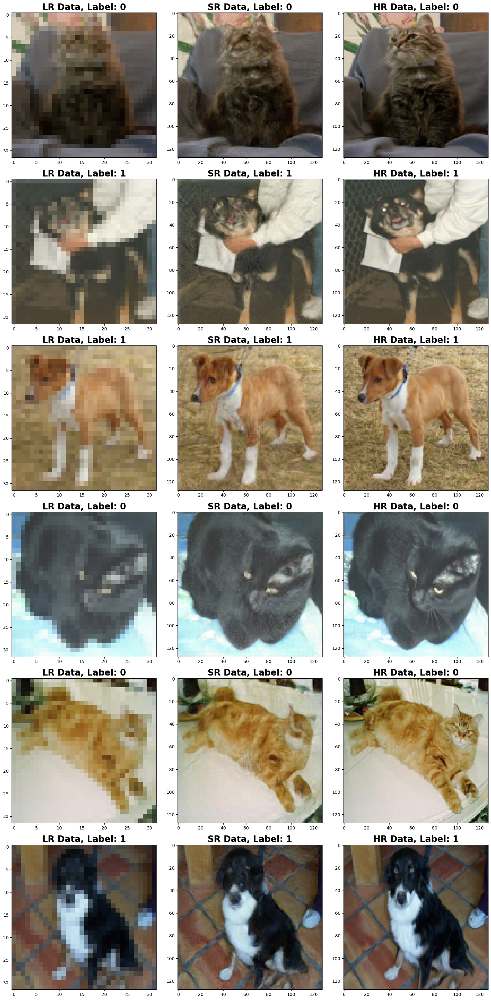

In [5]:
#Plot a few images from LR, SR and HR datasets to verify everything looks correct:
fig, ax = plt.subplots(nrows=6,ncols=3, figsize=(16,32))
for image in range(0, 17, 3):
    plt.subplot(6,3,image+1)
    plt.imshow(nn_images_32_LR[image])
    plt.title("LR Data, Label: {}".format(nn_images_labels[image]), fontsize=20, fontweight='bold')
    plt.subplot(6,3,image+2)
    plt.imshow(nn_images_128_SR[image])
    plt.title("SR Data, Label: {}".format(nn_images_labels[image]), fontsize=20, fontweight='bold')
    plt.subplot(6,3,image+3)
    plt.imshow(nn_images_128_HR[image])
    plt.title("HR Data, Label: {}".format(nn_images_labels[image]), fontsize=20, fontweight='bold')
    fig.tight_layout()

From the images shown in the above cell, the GAN sharpened images have resulted in an impressive approximation to the original HR images. However, the sharpening GAN has introduced some artefacts in the second last image of a cat where the white area below the cat has been increased in brightness and yellow colour. It will be interesting to see if these artefacts cause the NN classifier on the SR data to result in poor classification accuracy.
However, before being passed to any NN classifiers, the classes contained in each dataset will need to be inspected and balanced if necessary.

# 3. Transforming the Input Data
Now that the images and labels have been loaded in and verified that they are all synchronised, it is time to clean the data by performing some transformations. Firstly, the classes in the dataset will be balanced, as this is essential for any data that is being used to train a neural network classifier to avoid bias.

# 3.1 Balancing Classes


In [4]:
# Quick verification that the classes are balanced in the processed dataset:
cat_counts = int(0)
cat_indices = []
dog_counts = int(0)

dog_indices = []
for index, element in enumerate(nn_images_labels):
    if element == 0: 
        cat_counts+=1
        cat_indices.append(index)
    else:  
        dog_counts+=1
        dog_indices.append(index)

print("Total No. of Images:", len(nn_images_labels))
print("No. Cat Images:", cat_counts)
print("No. Dog Images:", dog_counts)

Total No. of Images: 5693
No. Cat Images: 2834
No. Dog Images: 2859


From the output of the above cell it can be seen that the classes are not balanced in the 32x32 LR NN training dataset, which will also be reflected in the HR and SR datasets as all of these three datasets contain the exact same images. All of these datasets will need to be balanced before training any NN classifiers to avoid bias.

In [5]:
# Exclude some dog images to balance the dataset:
num_dog_indices_to_remove = dog_counts - cat_counts
print("num_dog_indices_to_remove:", num_dog_indices_to_remove)
dog_indices_to_remove = dog_indices[:num_dog_indices_to_remove]
len(dog_indices_to_remove)
print("dog_indices_to_remove[:10]:", dog_indices_to_remove[:])

num_dog_indices_to_remove: 25
dog_indices_to_remove[:10]: [1, 2, 3, 5, 6, 10, 11, 14, 15, 16, 18, 20, 24, 26, 27, 29, 33, 35, 39, 43, 44, 45, 47, 49, 52]


From the output of the above cell it can be seen that removing 25 of the dog images will balance the classes in the dataset. A function will be created that can be used to balance each LR, HR and SR version of the cats vs dogs dataset in the next cell.

In [6]:
def cats_dogs_class_balancer(input_images, input_labels):
    print("Input images shape:", np.shape(input_images))
    print("Input labels shape:", np.shape(input_labels))
    
    # count the instances of each class:
    cat_counts = int(0)
    cat_indices = []
    dog_counts = int(0)
    dog_indices = []
    for index, element in enumerate(input_labels):
        if element == 0: 
            cat_counts+=1
            cat_indices.append(index)
        else:  
            dog_counts+=1
            dog_indices.append(index)
    print("No. cat images before balancing:", cat_counts)
    print("No. dog images before balancing:", dog_counts)
    
    # Exclude some dog images to balance the dataset:
    num_dog_indices_to_remove = dog_counts - cat_counts
    print("num_dog_indices_to_remove:", num_dog_indices_to_remove)
    dog_indices_to_remove = dog_indices[:num_dog_indices_to_remove]
    print("dog_indices_to_remove:", dog_indices_to_remove)
        
    # Balance the classes:
    print("**Balancing Classes**")
    removed_images_labels = []
    balanced_images = []
    balanced_labels = []
    for index,element in enumerate(input_images): 
        if index in dog_indices_to_remove:
            removed_images_labels.append((element, input_labels[index]))
        else:
            balanced_images.append(element)
            balanced_labels.append(input_labels[index])

    print("Shape of removed images:", np.shape(removed_images_labels))
    print("Shape of balanced images:", np.shape(balanced_images))
    print("Shape of balanced labels:", np.shape(balanced_labels))
    
    # Print out the new counts of each class in the balanced data:
    cat_counts2 = int(0)
    cat_indices2 = []
    dog_counts2 = int(0)
    dog_indices2 = []
    for index, element in enumerate(balanced_labels):
        if element == 0: 
            cat_counts2+=1
            cat_indices2.append(index)
        else:  
            dog_counts2+=1
            dog_indices2.append(index)
    print("No. cat images after balancing:", cat_counts2)
    print("No. dog images after balancing:", dog_counts2)
    
    return balanced_images, balanced_labels

In [7]:
nn_images_32_LR_bal, nn_images_labels_bal = cats_dogs_class_balancer(
    nn_images_32_LR, nn_images_labels)

Input images shape: (5693, 32, 32, 3)
Input labels shape: (5693,)
No. cat images before balancing: 2834
No. dog images before balancing: 2859
num_dog_indices_to_remove: 25
dog_indices_to_remove: [1, 2, 3, 5, 6, 10, 11, 14, 15, 16, 18, 20, 24, 26, 27, 29, 33, 35, 39, 43, 44, 45, 47, 49, 52]
**Balancing Classes**
Shape of removed images: (25, 2)
Shape of balanced images: (5668, 32, 32, 3)
Shape of balanced labels: (5668,)
No. cat images after balancing: 2834
No. dog images after balancing: 2834


/opt/conda/lib/python3.7/site-packages/numpy/core/fromnumeric.py:1970: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  result = asarray(a).shape


From the output of the above cell, it can be seen that the classes are now balanced for the first neural network training data set, the LR 32x32 images. It is worth inspecting the balanced data by visualising some of the images and associated labels, to ensure that the labels match up to the pictures, which will be done shortly. Next, the SR and HR image datasets will also be balanced, along with the associated labels which should be synchronised with all three datasets.

In [8]:
# Balance the SR dataset classes:
nn_images_128_SR_bal,_ = cats_dogs_class_balancer(nn_images_128_SR, nn_images_labels)

Input images shape: (5693, 128, 128, 3)
Input labels shape: (5693,)
No. cat images before balancing: 2834
No. dog images before balancing: 2859
num_dog_indices_to_remove: 25
dog_indices_to_remove: [1, 2, 3, 5, 6, 10, 11, 14, 15, 16, 18, 20, 24, 26, 27, 29, 33, 35, 39, 43, 44, 45, 47, 49, 52]
**Balancing Classes**
Shape of removed images: (25, 2)
Shape of balanced images: (5668, 128, 128, 3)
Shape of balanced labels: (5668,)
No. cat images after balancing: 2834
No. dog images after balancing: 2834


Next, the HR images will also be balanced.

In [9]:
# Balance the SR dataset classes:
nn_images_128_HR_bal,_ = cats_dogs_class_balancer(nn_images_128_HR, nn_images_labels)

Input images shape: (5693, 128, 128, 3)
Input labels shape: (5693,)
No. cat images before balancing: 2834
No. dog images before balancing: 2859
num_dog_indices_to_remove: 25
dog_indices_to_remove: [1, 2, 3, 5, 6, 10, 11, 14, 15, 16, 18, 20, 24, 26, 27, 29, 33, 35, 39, 43, 44, 45, 47, 49, 52]
**Balancing Classes**
Shape of removed images: (25, 2)
Shape of balanced images: (5668, 128, 128, 3)
Shape of balanced labels: (5668,)
No. cat images after balancing: 2834
No. dog images after balancing: 2834


In [10]:
# Print out some metrics on the shape and contents of the balanced image data and labels:
print("nn_images_32_LR_bal shape:", np.shape(nn_images_32_LR_bal))
print("nn_images_128_HR_bal shape:", np.shape(nn_images_128_HR_bal))
print("nn_images_128_SR_bal shape:", np.shape(nn_images_128_SR_bal))
print("nn_images_labels_bal shape:", np.shape(nn_images_labels_bal))
print("np.unique(nn_images_labels_bal):", np.unique(nn_images_labels_bal))

print("-----------------------------------------------")
print("Minimum and Maximum Image pixel values:")
print("-----------------------------------------------")
print("nn_images_32_LR_bal:", "max:", np.max(nn_images_32_LR_bal), ", min:", np.min(nn_images_32_LR_bal))
print("nn_images_128_HR_bal:", "max:", np.max(nn_images_128_HR_bal), ", min:", np.min(nn_images_128_HR_bal))
print("nn_images_128_SR_bal:", "max:", np.max(nn_images_128_SR_bal), ", min:", np.min(nn_images_128_SR_bal))

nn_images_32_LR_bal shape: (5668, 32, 32, 3)
nn_images_128_HR_bal shape: (5668, 128, 128, 3)
nn_images_128_SR_bal shape: (5668, 128, 128, 3)
nn_images_labels_bal shape: (5668,)
np.unique(nn_images_labels_bal): [0 1]
-----------------------------------------------
Minimum and Maximum Image pixel values:
-----------------------------------------------
nn_images_32_LR_bal: max: 255 , min: 0
nn_images_128_HR_bal: max: 255 , min: 0
nn_images_128_SR_bal: max: 1.0 , min: 0.0


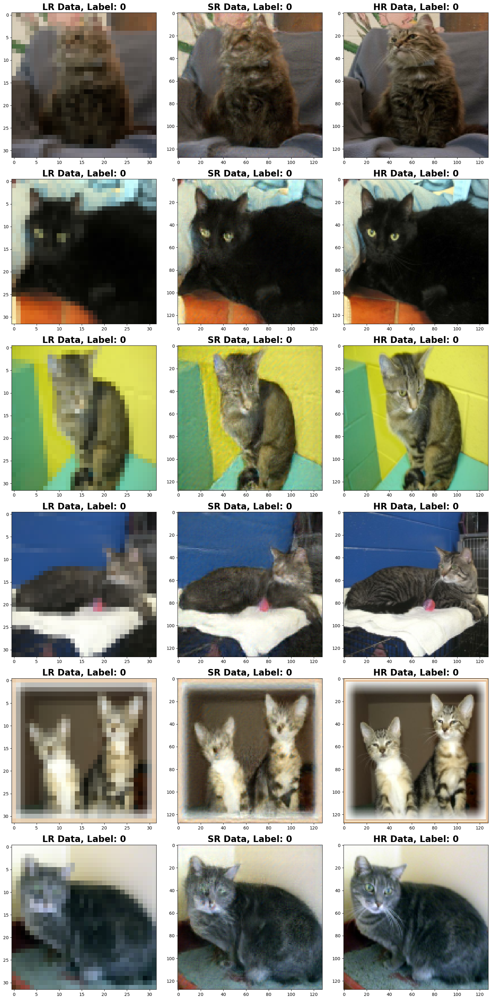

In [24]:
# Now plot some of these images to inspect if the labels and images are synchronised:
#Plot a few images from LR, SR and HR datasets to verify everything looks correct:
fig, ax = plt.subplots(nrows=6,ncols=3, figsize=(16,32))
for image in range(0, 17, 3):
    plt.subplot(6,3,image+1)
    plt.imshow(nn_images_32_LR_bal[image])
    plt.title("LR Data, Label: {}".format(nn_images_labels_bal[image]), fontsize=20, fontweight='bold')
    plt.subplot(6,3,image+2)
    plt.imshow(nn_images_128_SR_bal[image])
    plt.title("SR Data, Label: {}".format(nn_images_labels_bal[image]), fontsize=20, fontweight='bold')
    plt.subplot(6,3,image+3)
    plt.imshow(nn_images_128_HR_bal[image])
    plt.title("HR Data, Label: {}".format(nn_images_labels_bal[image]), fontsize=20, fontweight='bold')
    fig.tight_layout()

It can be seen from the images shown in the previous cell that the images are aligned across all three datasets and these correspond to the labels. Due to removing the first 25 dog images to balance the classes in the dataset, many of the first images are of cats only. It is essential that the data is shuffled before it is passed into the neural networks for training.

Now the datasets will be split into train, validation and test partitions as this is required for correct development of neural networks.

# 3.2 Shuffling the Data

In [11]:
# Shuffle all of the image datasets and labels in a consistent way:
nn_images_32_LR_bal, nn_images_128_SR_bal, nn_images_128_HR_bal, nn_images_labels_bal = shuffle(
    nn_images_32_LR_bal, nn_images_128_SR_bal, nn_images_128_HR_bal, nn_images_labels_bal,
    random_state=7889)

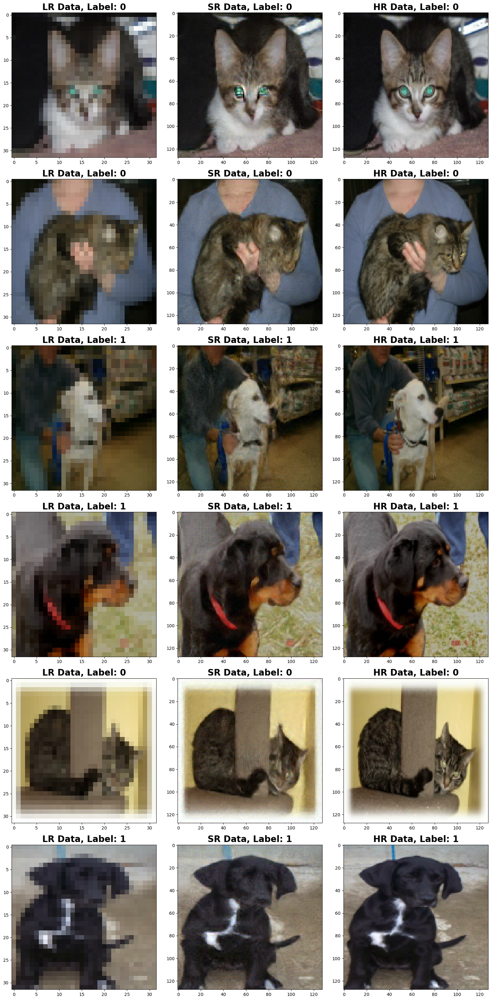

In [12]:
# Now plot some of these images to inspect if labels and images are synchronised after shuffling:
fig, ax = plt.subplots(nrows=6,ncols=3, figsize=(16,32))
for image in range(0, 17, 3):
    plt.subplot(6,3,image+1)
    plt.imshow(nn_images_32_LR_bal[image])
    plt.title("LR Data, Label: {}".format(nn_images_labels_bal[image]), fontsize=20, fontweight='bold')
    plt.subplot(6,3,image+2)
    plt.imshow(nn_images_128_SR_bal[image])
    plt.title("SR Data, Label: {}".format(nn_images_labels_bal[image]), fontsize=20, fontweight='bold')
    plt.subplot(6,3,image+3)
    plt.imshow(nn_images_128_HR_bal[image])
    plt.title("HR Data, Label: {}".format(nn_images_labels_bal[image]), fontsize=20, fontweight='bold')
    fig.tight_layout()

From the images and associated lables shown in the above cell, it is clear that the shuffled LR, SR, HR datasets and associated labels are all synchronised. 


Next, the the LR, SR, HR image datasets and labels need to be split up into training, validation and test sets which is essential for training any neural network classifer algorithms. This will need to be done carefully to ensure that the data in each of these subsets contained balanced classes, to avoid introudcing bias into the neural network classifiers being trained. This can be achived efficiently via the scikit-learn Stratified Shuffle Split function, which will work correctly due to the LR, SR and HR datasets now having balanced classes.

# 3.3 Create Training, Validation and Test Datasets
Each of the LR, HR and SR datasets along with the associated labels will be split up into train, validation and test partitions.

In [13]:
def class_counter(input_labels, name):  
    """
    This function will print out the class counts from the input_labels data.
    Note: the input_labels variable should contain labels in numerical format, not in onehot encoded format.
    """
    num_samples = len(input_labels)
    print("Total Number of elements in input dataset:", num_samples)
    classes = np.unique(input_labels)
    print("Dataset Unique Classes:", classes)
    class_counts = {}
    # Create the dictionary entries based on the number of classes in the input data:
    for element in classes:
        class_counts[element] = 0
    # Increment each created dictionary entry based on the input labels:
    for i in input_labels:
        class_counts[i.item()] += 1
    print(name, "class counts: \n", class_counts)
    return 

Next, sklearn StratifiedShuffleSplit will be used to split the neural network data containing 5,668 images into training validation and test subsets, while maintaining equal class representations in each subset. To do this, the data will be first split into a "full training" and "test" set, using 15% of the data for the test set. Then the "full training" set will be split again to form the "training" and "validation" subsets, using 15% of this data for validation set. During this splitting process, the LR and HR data will be converted to floating point format, to save this having to be done as an extra step, as that would likely consume additional RAM if more unnecessary variables are created.

In [14]:
# Create the full training and test datasets and also convert the pixel values to the range [0,1] at the same time:
sss1 = StratifiedShuffleSplit(n_splits=1, test_size=0.151, random_state=7889)
sss1.get_n_splits(nn_images_32_LR_bal, nn_images_labels_bal)

for train_index, test_index in sss1.split(nn_images_32_LR_bal, nn_images_labels_bal):
    # Create the full training set that will later be split again to create the validation sets:
    x_train_32_full = [nn_images_32_LR_bal[x].astype('float32')/255 for x in train_index]
    x_train_128_HR_full = [nn_images_128_HR_bal[x].astype('float32')/255 for x in train_index]
    x_train_128_SR_full = [nn_images_128_SR_bal[x] for x in train_index] # SR data is already in the range [0,1]
    y_train_full = [nn_images_labels_bal[x] for x in train_index]
    # Create the test sets:
    x_test_32 = [nn_images_32_LR_bal[x].astype('float32')/255 for x in test_index]
    x_test_128_HR = [nn_images_128_HR_bal[x].astype('float32')/255 for x in test_index]
    x_test_128_SR = [nn_images_128_SR_bal[x] for x in test_index]
    y_test = [nn_images_labels_bal[x] for x in test_index]
    
class_counter(y_train_full, "y_train_full")
print("-----------------------")
class_counter(y_test, "y_test")

Total Number of elements in input dataset: 4812
Dataset Unique Classes: [0 1]
y_train_full class counts: 
 {0: 2406, 1: 2406}
-----------------------
Total Number of elements in input dataset: 856
Dataset Unique Classes: [0 1]
y_test class counts: 
 {0: 428, 1: 428}


From the output above, the full training and test subsets contain balanced classes, as required. Next, the full training set will be split again to generate the training and validation sets.

In [15]:
# Split the full training data again to create the taining and validation datasets:
sss2 = StratifiedShuffleSplit(n_splits=1, test_size=0.15, random_state=7889)
sss2.get_n_splits(x_train_32_full, nn_images_labels_bal)
for train_index, val_index in sss2.split(x_train_32_full, y_train_full):
    # Create the full training set that will later be split again to create the validation sets:
    x_train_32 = [x_train_32_full[x] for x in train_index]
    x_train_128_HR = [x_train_128_HR_full[x] for x in train_index]
    x_train_128_SR = [x_train_128_SR_full[x] for x in train_index]
    y_train = [y_train_full[x] for x in train_index]
    # Create the test sets:
    x_val_32 = [x_train_32_full[x] for x in val_index]
    x_val_128_HR = [x_train_128_HR_full[x] for x in val_index]
    x_val_128_SR = [x_train_128_SR_full[x] for x in val_index]
    y_val = [y_train_full[x] for x in val_index]

In [16]:
class_counter(y_train, "y_train")
print("--------------------------")
class_counter(y_val, "y_val")
print("--------------------------")
class_counter(y_test, "y_test")
print("--------------------------")

# Convert all labels to onehot encoded:
y_train = keras.utils.to_categorical(y_train, 2) 
y_val = keras.utils.to_categorical(y_val, 2)
y_test = keras.utils.to_categorical(y_test, 2)  

Total Number of elements in input dataset: 4090
Dataset Unique Classes: [0 1]
y_train class counts: 
 {0: 2045, 1: 2045}
--------------------------
Total Number of elements in input dataset: 722
Dataset Unique Classes: [0 1]
y_val class counts: 
 {0: 361, 1: 361}
--------------------------
Total Number of elements in input dataset: 856
Dataset Unique Classes: [0 1]
y_test class counts: 
 {0: 428, 1: 428}
--------------------------


From the output of the above cell, it has been shown that training, validation and test datasets now have equal class representations, as desired. 

In [17]:
# Convert all image datasets to numpy arrays, as this is required for passing to the neural network models:
x_train_32 = np.array(x_train_32)
x_val_32 = np.array(x_val_32)
x_test_32 = np.array(x_test_32)
x_train_128_HR = np.array(x_train_128_HR) 
x_val_128_HR = np.array(x_val_128_HR)
x_test_128_HR = np.array(x_test_128_HR)
x_train_128_SR = np.array(x_train_128_SR) 
x_val_128_SR = np.array(x_val_128_SR)
x_test_128_SR = np.array(x_test_128_SR)

In [18]:
# Print out the shapes and min/max pixel values of all of the segmented datasets so these can be verified:
print("---------- Training Data and Labels ----------")
print("x_train_32:    ", np.shape(x_train_32), ", max:", np.max(x_train_32), ", min:", np.min(x_train_32))
print("x_train_128_HR:", np.shape(x_train_128_HR), ", max:", np.max(x_train_128_HR), ", min:", np.min(x_train_128_HR))
print("x_train_128_SR:", np.shape(x_train_128_SR), ", max:", np.max(x_train_128_SR), ", min:", np.min(x_train_128_SR))
print("y_train shape: ", np.shape(y_train), "\n")

print("---------- Validation Data and Labels ----------")
print("x_val_32:    ", np.shape(x_val_32), ", max:", np.max(x_val_32), ", min:", np.min(x_val_32))
print("x_val_128_HR:", np.shape(x_val_128_HR), ", max:", np.max(x_val_128_HR), ", min:", np.min(x_val_128_HR))
print("x_val_128_SR:", np.shape(x_val_128_SR), ", max:", np.max(x_val_128_SR), ", min:", np.min(x_val_128_SR))
print("y_val shape: ", np.shape(y_val), "\n")

print("---------- Test Data and Labels ----------")
print("x_test_32 shape:    ", np.shape(x_test_32), ", max:", np.max(x_test_32), ", min:", np.min(x_test_32))
print("x_test_128_HR shape:", np.shape(x_test_128_HR), ", max:", np.max(x_test_128_HR), ", min:", np.min(x_test_128_HR))
print("x_test_128_SR shape:", np.shape(x_test_128_SR), ", max:", np.max(x_test_128_SR), ", min:", np.min(x_test_128_SR))
print("y_test shape:       ", np.shape(y_test))

---------- Training Data and Labels ----------
x_train_32:     (4090, 32, 32, 3) , max: 1.0 , min: 0.0
x_train_128_HR: (4090, 128, 128, 3) , max: 1.0 , min: 0.0
x_train_128_SR: (4090, 128, 128, 3) , max: 1.0 , min: 0.0
y_train shape:  (4090, 2) 

---------- Validation Data and Labels ----------
x_val_32:     (722, 32, 32, 3) , max: 1.0 , min: 0.0
x_val_128_HR: (722, 128, 128, 3) , max: 1.0 , min: 0.0
x_val_128_SR: (722, 128, 128, 3) , max: 1.0 , min: 0.0
y_val shape:  (722, 2) 

---------- Test Data and Labels ----------
x_test_32 shape:     (856, 32, 32, 3) , max: 1.0 , min: 0.0
x_test_128_HR shape: (856, 128, 128, 3) , max: 1.0 , min: 0.0
x_test_128_SR shape: (856, 128, 128, 3) , max: 1.0 , min: 0.0
y_test shape:        (856, 2)


From the output of the above two cells, conducting an analysis of the detailed print out of some metrics on the various data subsets should give confidence that the operations have worked successfully. Here are the key observations:

* **1.** The labels for train, validation and test sets each contain equal representations of the two classes.
* **2.** The LR and HR pixel data has been converted to floating point format and scaled to the range of [0,1].
* **3.** The SR pixel data is all within the range of [0,1]. 
* **4.** The LR, HR and SR image datasets contain the correct number of samples and the pixel dimensions look correct in each dataset.
* **5.** There is no way to verify that the labels match up to the images from the above information, so this will be verified in the next cell by visualising random samples of images from each subset and confirming that these are synchronised with the labels. 

To verify that the images and labels are synchronised acrosss all data subsets, 10 random images will be shown from each subset along with the associated label. If the 10 random images from each subset all align with the associated labels, this can give confidence that the full subsets contain synchronised images and labels. This visualisation will be done three times: once for training, once for validation and once for test the data.

# 3.4 Training Data Visualisation

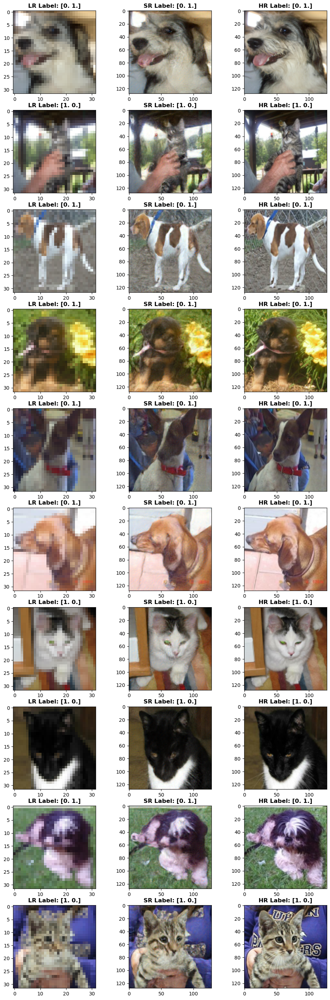

In [22]:
# Plot some of the training data and associated labels:   
fig, ax = plt.subplots(nrows=10,ncols=3, figsize=(12,36))
np.random.seed(7889)
for image in range(0, 29, 3):
    random_train_index = int(np.random.randint(low = 1, high = len(x_train_32), size = 1))
    plt.subplot(10,3,image+1)
    plt.imshow(x_train_32[random_train_index])
    label = y_train[random_train_index]
    plt.title("LR Label: {}".format(label), fontsize=12, fontweight='bold')
    plt.subplot(10,3,image+2)
    plt.imshow(x_train_128_SR[random_train_index])
    plt.title("SR Label: {}".format(label), fontsize=12, fontweight='bold')
    plt.subplot(10,3,image+3)
    plt.imshow(x_train_128_HR[random_train_index])
    plt.title("HR Label: {}".format(label), fontsize=12, fontweight='bold')

From the output above, all images in the LR, SR and HR training image datasets and associated training labels are in alignment.

# 3.5 Validation Data Visualisation

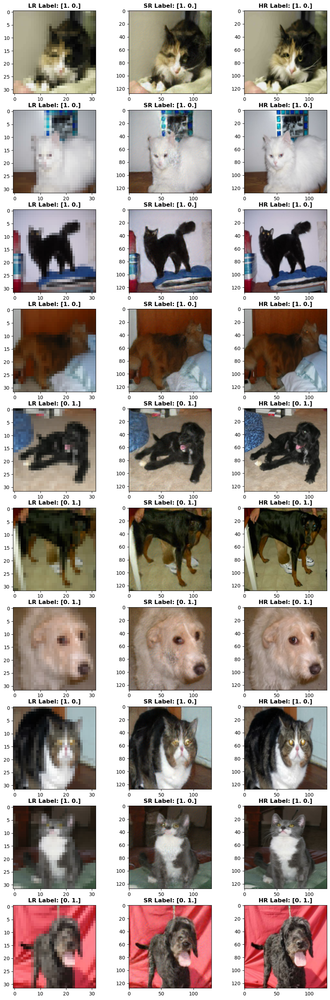

In [23]:
# Plot some of the validation data and associated labels:   
fig, ax = plt.subplots(nrows=10, ncols=3, figsize=(12,36))
np.random.seed(7889)
for image in range(0, 29, 3):
    random_val_index = int(np.random.randint(low = 1, high = len(x_val_32), size = 1))
    plt.subplot(10,3,image+1)
    plt.imshow(x_val_32[random_val_index])
    label = y_val[random_val_index]
    plt.title("LR Label: {}".format(label), fontsize=12, fontweight='bold')
    plt.subplot(10,3,image+2)
    plt.imshow(x_val_128_SR[random_val_index])
    plt.title("SR Label: {}".format(label), fontsize=12, fontweight='bold')
    plt.subplot(10,3,image+3)
    plt.imshow(x_val_128_HR[random_val_index])
    plt.title("HR Label: {}".format(label), fontsize=12, fontweight='bold')

From the output above, all images in the LR, SR and HR validation image datasets and associated validation labels are in alignment.

# 3.6 Test Data Visualisation

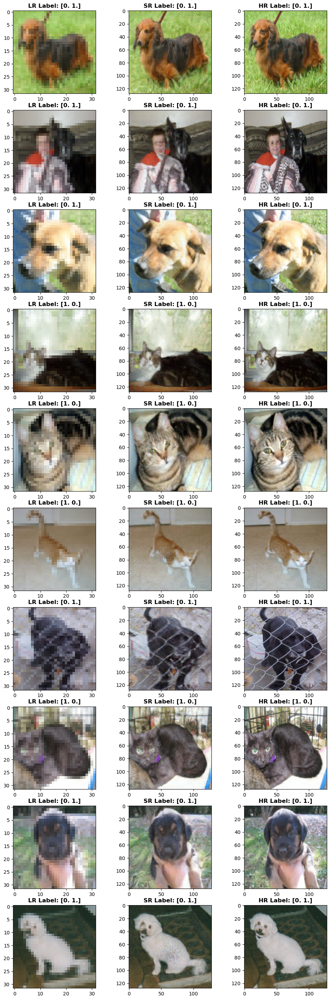

In [24]:
# Plot some of the test data and associated labels:   
fig, ax = plt.subplots(nrows=10, ncols=3, figsize=(12,36))
np.random.seed(7889)
for image in range(0, 29, 3):
    random_test_index = int(np.random.randint(low = 1, high = len(x_test_32), size = 1))
    plt.subplot(10,3,image+1)
    plt.imshow(x_test_32[random_test_index])
    label = y_test[random_test_index]
    plt.title("LR Label: {}".format(label), fontsize=12, fontweight='bold')
    plt.subplot(10,3,image+2)
    plt.imshow(x_test_128_SR[random_test_index])
    plt.title("SR Label: {}".format(label), fontsize=12, fontweight='bold')
    plt.subplot(10,3,image+3)
    plt.imshow(x_test_128_HR[random_test_index])
    plt.title("HR Label: {}".format(label), fontsize=12, fontweight='bold')

From the output above, all images in the LR, SR and HR test image datasets and associated test labels are in alignment.

Based on the images shown in the previous few cells, it is clear that all of the data subsets and associated labels are synchronised after the splittling operations. The dataset shapes and pixel ranges have also been inspected and these are satisfactory. Now these datasets can be used for training the neural network classifiers.

Datasets prepared for Neural Network training:
* **1:** 32x32 pixels LR colour cats dogs images. There are 5668 images in total with balanced class representations. None of these images have been seen by the image sharpening GAN during training. This dataset was shuffled and split up to create train, validation and test subsets. 
* **2:** 128x128 pixels SR sharpened colour cats dogs images. There are 5668 images in total with balanced class representations. These are the same images as those in the first dataset, only these are higher resolution. This data was also split up into train, validation and test subsets.
* **3:** Image labels that correspond to both datasets above, with 5668 labels in total, with onehot encoding format. This data was also shuffled and split up into train, validation and test subsets.

# 4. Train the First Neural Network Classifier Models on the LR 32x32 Pixel Data
Here the first neural network classifiers will created and these will be trained using the 32x32 LR pixel balanced dataset from the cats vs. dogs data. This dataset contains 5,668 images of cats and dogs, and none of these images were used in the process of training the GAN. These 5,668 images were then shuffled and split up into train, validation and test datasets, with each containing balanced classes.

In [19]:
def model_plots(history_dict):
    """
    This function will plot the training accuracy and training loss one one plot and it will plot the 
    validation accuracy and validation loss on a second plot alongside the first. Each plot will show the 4 
    mentioned metrics for each of the model training epochs.
    Input: model history_dict.
    Outputs: 2 plots showing the key model metrics during training. 
    """
    # Left hand side plot: 
    plt.subplots(1,2, figsize = (13,6))
    acc = history_dict['acc']
    val_acc = history_dict['val_acc']   
    epochs = range(1, len(acc) + 1)
    plt.subplot(1,2,1)
    red_dash = 'r--'
    green_solid = 'g'
    plt.plot(epochs, acc, red_dash, label = 'Training Accuracy')
    plt.plot(epochs, val_acc, green_solid, label = 'Validation Accuracy')
    plt.title('Training & Validation Accuracy \n', fontsize = "18", fontweight="bold")
    plt.xlabel('Epochs', fontsize = "13")
    plt.ylabel('Accuracy', fontsize = "13")
    plt.legend()
    plt.grid()
    
    # Right hand side plot:
    plt.subplot(1,2,2)
    loss = history_dict['loss']
    val_loss = history_dict['val_loss']
    epochs = range(1, len(loss) + 1)
    plt.plot(epochs, loss, red_dash, label = 'Training Loss')
    plt.plot(epochs, val_loss, green_solid, label = 'Validation Loss')
    plt.title('Training & Validation Loss \n', fontsize = "18", fontweight="bold")
    plt.xlabel('Epochs', fontsize = "13")
    plt.ylabel('Loss', fontsize = "13")
    plt.legend()
    plt.grid()
    plt.tight_layout()
    plt.show()
    return

In [23]:
# Neural Network Classifier for the 32x32 cats vs dogs LR data:
model_1 = models.Sequential()
model_1.add(layers.Conv2D(32, (3, 3), activation='relu',input_shape=(32, 32, 3)))
model_1.add(layers.MaxPooling2D((2, 2)))
model_1.add(layers.Conv2D(64, (3, 3), activation='relu'))
model_1.add(layers.MaxPooling2D((2, 2)))
model_1.add(layers.Conv2D(128, (3, 3), activation='relu'))
model_1.add(layers.MaxPooling2D((2, 2)))
model_1.add(layers.Flatten()) 
model_1.add(layers.Dense(256, activation='relu'))
model_1.add(layers.Dense(2, activation='softmax'))
model_1.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_3 (Conv2D)            (None, 30, 30, 32)        896       
_________________________________________________________________
max_pooling2d_3 (MaxPooling2 (None, 15, 15, 32)        0         
_________________________________________________________________
conv2d_4 (Conv2D)            (None, 13, 13, 64)        18496     
_________________________________________________________________
max_pooling2d_4 (MaxPooling2 (None, 6, 6, 64)          0         
_________________________________________________________________
conv2d_5 (Conv2D)            (None, 4, 4, 128)         73856     
_________________________________________________________________
max_pooling2d_5 (MaxPooling2 (None, 2, 2, 128)         0         
_________________________________________________________________
flatten_1 (Flatten)          (None, 512)              

In [140]:
model_1.compile(loss='categorical_crossentropy',
              optimizer=optimizers.RMSprop(learning_rate=1e-4),
              metrics=['acc'])
history_1 = model_1.fit(x_train_32, y_train, validation_data=(x_val_32, y_val), 
                        batch_size = 50, epochs = 100, shuffle=True)
# Save the model:
model_1.save('32_LR_100e_model_1.h5')

Epoch 1/100
82/82 [==============================] - 4s 33ms/step - loss: 0.6884 - acc: 0.5418 - val_loss: 0.6840 - val_acc: 0.5748
Epoch 2/100
82/82 [==============================] - 3s 36ms/step - loss: 0.6769 - acc: 0.5839 - val_loss: 0.6748 - val_acc: 0.5859
Epoch 3/100
82/82 [==============================] - 3s 33ms/step - loss: 0.6643 - acc: 0.6108 - val_loss: 0.6653 - val_acc: 0.6080
Epoch 4/100
82/82 [==============================] - 2s 30ms/step - loss: 0.6496 - acc: 0.6240 - val_loss: 0.6581 - val_acc: 0.5970
Epoch 5/100
82/82 [==============================] - 2s 30ms/step - loss: 0.6395 - acc: 0.6369 - val_loss: 0.6429 - val_acc: 0.6343
Epoch 6/100
82/82 [==============================] - 3s 35ms/step - loss: 0.6273 - acc: 0.6538 - val_loss: 0.6336 - val_acc: 0.6413
Epoch 7/100
82/82 [==============================] - 3s 35ms/step - loss: 0.6182 - acc: 0.6616 - val_loss: 0.6994 - val_acc: 0.5693
Epoch 8/100
82/82 [==============================] - 3s 41ms/step - loss: 0.

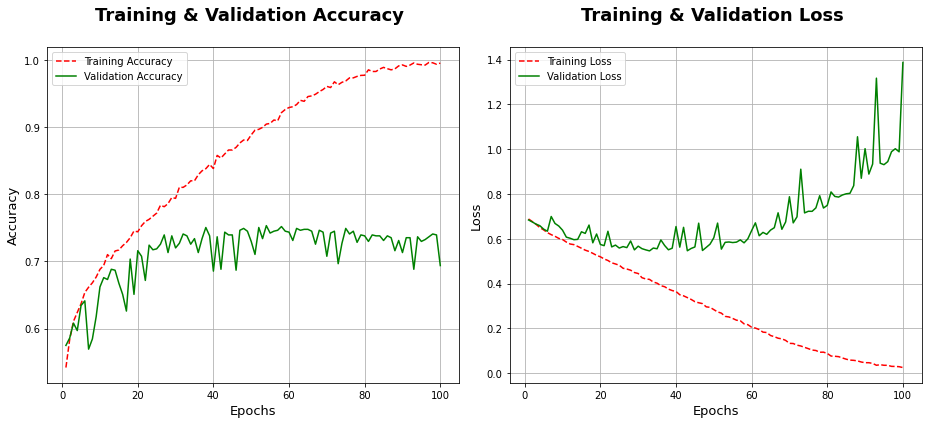

In [141]:
model_plots(history_1.history)

In [64]:
# Retrain the model for 33 epochs to just before it starts to overfit the training data:
model_1B = models.Sequential()
model_1B.add(layers.Conv2D(32, (3, 3), activation='relu',input_shape=(32, 32, 3)))
model_1B.add(layers.MaxPooling2D((2, 2)))
model_1B.add(layers.Conv2D(64, (3, 3), activation='relu'))
model_1B.add(layers.MaxPooling2D((2, 2)))
model_1B.add(layers.Conv2D(128, (3, 3), activation='relu'))
model_1B.add(layers.MaxPooling2D((2, 2)))
model_1B.add(layers.Flatten()) 
model_1B.add(layers.Dense(256, activation='relu'))
model_1B.add(layers.Dense(2, activation='softmax'))
model_1B.summary()

model_1B.compile(loss='categorical_crossentropy',
              optimizer=optimizers.RMSprop(learning_rate=1e-4),
              metrics=['acc'])

history_1B = model_1B.fit(x_train_32, y_train, batch_size=50, validation_data = (x_val_32, y_val), 
                          epochs=33, shuffle=True)
# Save the model:
model_1B.save('32_LR_33e_model_1B.h5')

Model: "sequential_11"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_33 (Conv2D)          (None, 30, 30, 32)        896       
                                                                 
 max_pooling2d_33 (MaxPoolin  (None, 15, 15, 32)       0         
 g2D)                                                            
                                                                 
 conv2d_34 (Conv2D)          (None, 13, 13, 64)        18496     
                                                                 
 max_pooling2d_34 (MaxPoolin  (None, 6, 6, 64)         0         
 g2D)                                                            
                                                                 
 conv2d_35 (Conv2D)          (None, 4, 4, 128)         73856     
                                                                 
 max_pooling2d_35 (MaxPoolin  (None, 2, 2, 128)      

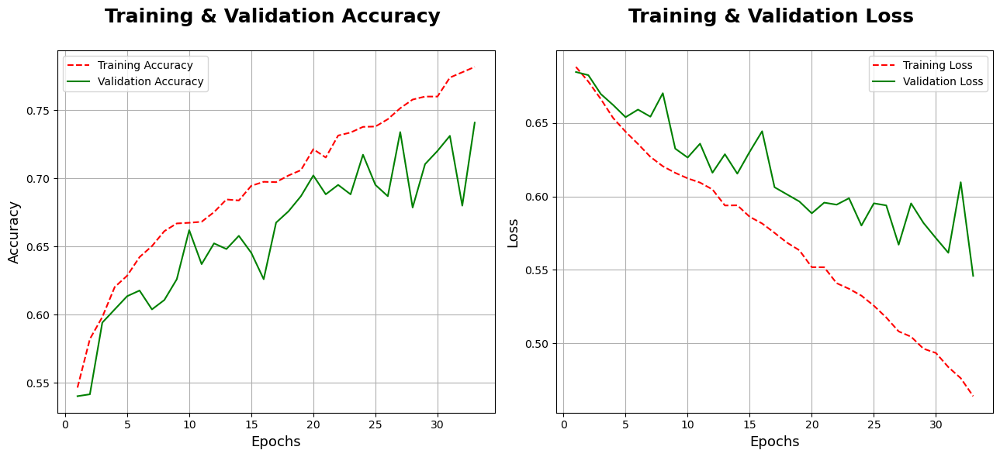

In [65]:
model_plots(history_1B.history)

In [68]:
model_1B.evaluate(x_test_32, y_test)

27/27 [==============================] - 0s 9ms/step - loss: 0.5354 - acc: 0.7290


[0.5354226231575012, 0.7289719581604004]

# 4.1 Adding Regularisation
Next, the model will be trained again but with L2 regularisation applied, to investigate if this leads to improved performance.

In [144]:
# Try retraining the above model with L2 regularisation added:
model_1C = models.Sequential()
model_1C.add(layers.Conv2D(32, (3, 3), activation='relu',input_shape=(32, 32, 3)))
model_1C.add(layers.MaxPooling2D((2, 2)))
model_1C.add(layers.Conv2D(64, (3, 3), activation='relu', kernel_regularizer = tf.keras.regularizers.l2(l=0.01)))
model_1C.add(layers.MaxPooling2D((2, 2)))
model_1C.add(layers.Conv2D(128, (3, 3), activation='relu', kernel_regularizer = tf.keras.regularizers.l2(l=0.01)))
model_1C.add(layers.MaxPooling2D((2, 2)))
model_1C.add(layers.Flatten()) 
model_1C.add(layers.Dense(256, activation='relu', kernel_regularizer = tf.keras.regularizers.l2(l=0.01)))
model_1C.add(layers.Dense(2, activation='softmax'))
model_1C.summary()

model_1C.compile(loss='categorical_crossentropy',
              optimizer=optimizers.RMSprop(learning_rate=1e-4),
              metrics=['acc'])

history_1C = model_1C.fit(x_train_32, y_train, batch_size=50, validation_data = (x_val_32, y_val), 
                          epochs=150, shuffle=True)
# Save the model:
model_1C.save('32_LR_150e_model_1C_L2.h5')

Model: "sequential_4"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_12 (Conv2D)           (None, 30, 30, 32)        896       
_________________________________________________________________
max_pooling2d_12 (MaxPooling (None, 15, 15, 32)        0         
_________________________________________________________________
conv2d_13 (Conv2D)           (None, 13, 13, 64)        18496     
_________________________________________________________________
max_pooling2d_13 (MaxPooling (None, 6, 6, 64)          0         
_________________________________________________________________
conv2d_14 (Conv2D)           (None, 4, 4, 128)         73856     
_________________________________________________________________
max_pooling2d_14 (MaxPooling (None, 2, 2, 128)         0         
_________________________________________________________________
flatten_4 (Flatten)          (None, 512)              

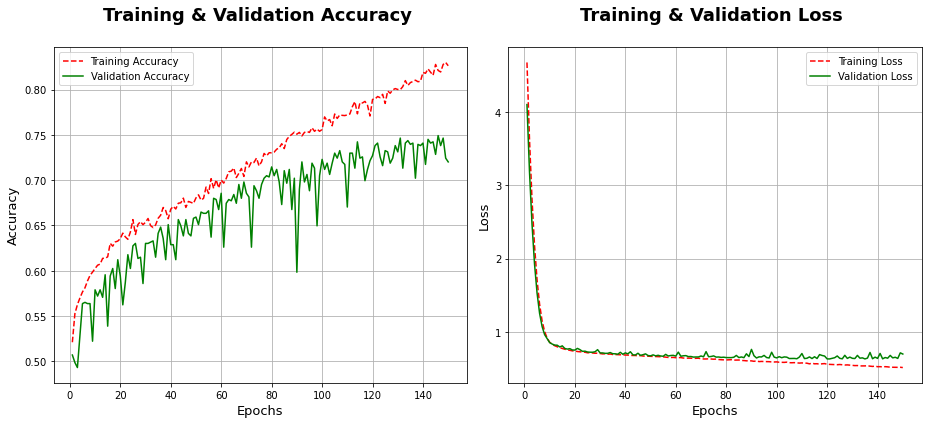

In [145]:
model_plots(history_1C.history)

In [38]:
# Retrain for 121 epochs before the model starts overfitting the training data:
model_1D = models.Sequential()
model_1D.add(layers.Conv2D(32, (3, 3), activation='relu',input_shape=(32, 32, 3)))
model_1D.add(layers.MaxPooling2D((2, 2)))
model_1D.add(layers.Conv2D(64, (3, 3), activation='relu', kernel_regularizer = tf.keras.regularizers.l2(l=0.01)))
model_1D.add(layers.MaxPooling2D((2, 2)))
model_1D.add(layers.Conv2D(128, (3, 3), activation='relu', kernel_regularizer = tf.keras.regularizers.l2(l=0.01)))
model_1D.add(layers.MaxPooling2D((2, 2)))
model_1D.add(layers.Flatten()) 
model_1D.add(layers.Dense(256, activation='relu', kernel_regularizer = tf.keras.regularizers.l2(l=0.01)))
model_1D.add(layers.Dense(2, activation='softmax'))
model_1D.summary()

model_1D.compile(loss='categorical_crossentropy',
              optimizer=optimizers.RMSprop(learning_rate=1e-4),
              metrics=['acc'])

history_1D = model_1D.fit(x_train_32, y_train, batch_size=50,
         validation_data = (x_val_32, y_val), epochs=121, shuffle=True)

# Save the model:
model_1D.save('32_LR_121e_model_1D_L2.h5')

Model: "sequential_9"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_30 (Conv2D)           (None, 30, 30, 32)        896       
_________________________________________________________________
max_pooling2d_30 (MaxPooling (None, 15, 15, 32)        0         
_________________________________________________________________
conv2d_31 (Conv2D)           (None, 13, 13, 64)        18496     
_________________________________________________________________
max_pooling2d_31 (MaxPooling (None, 6, 6, 64)          0         
_________________________________________________________________
conv2d_32 (Conv2D)           (None, 4, 4, 128)         73856     
_________________________________________________________________
max_pooling2d_32 (MaxPooling (None, 2, 2, 128)         0         
_________________________________________________________________
flatten_9 (Flatten)          (None, 512)              

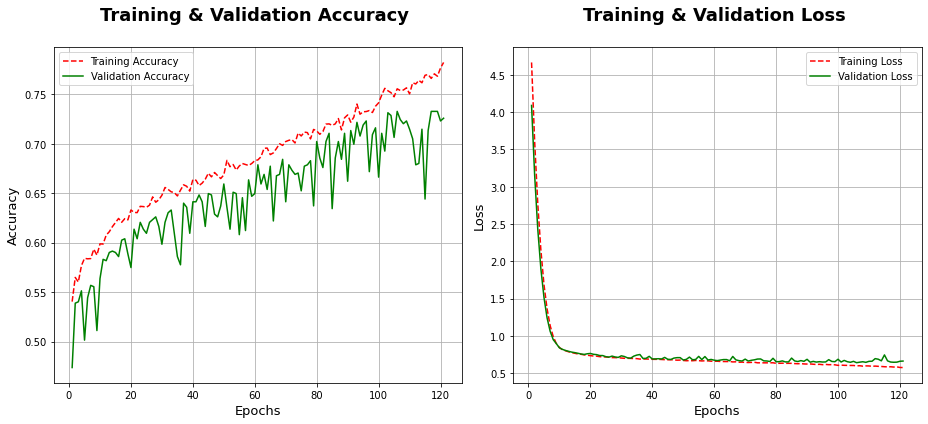

27/27 [==============================] - 0s 3ms/step - loss: 0.6583 - acc: 0.7208


[0.6582760810852051, 0.7207943797111511]

In [39]:
model_plots(history_1D.history)

# Evaluate this model on the test data:
model_1D.evaluate(x_test_32, y_test)

# 5. Training Models on the 128x128 Pixel Super Resolution (SR) Image Data
Now  the GAN sharpened super resolution (SR) data will be used to train another set of neural network classifier models. These models have an extra layer added due to the 4x increase in image size. Additionally, the convolution size was also increased to (6,6) from (3,3) due to the increased image size. 

In [148]:
# Create the first convolutional model for the SR data:
conv = 6
model_2 = models.Sequential()
model_2.add(layers.Conv2D(50, (conv, conv), activation='relu',
                        input_shape=(128, 128, 3)))
model_2.add(layers.MaxPooling2D((2, 2)))
model_2.add(layers.Conv2D(64, (conv, conv), activation='relu'))
model_2.add(layers.MaxPooling2D((2, 2)))
model_2.add(layers.Conv2D(128, (conv, conv), activation='relu'))
model_2.add(layers.MaxPooling2D((2, 2)))
model_2.add(layers.Conv2D(128, (conv, conv), activation='relu'))
model_2.add(layers.MaxPooling2D((2, 2)))
model_2.add(layers.Flatten())
model_2.add(layers.Dense(700, activation='relu'))
model_2.add(layers.Dense(2, activation='softmax'))
model_2.summary()

model_2.compile(loss='categorical_crossentropy',
              optimizer=optimizers.RMSprop(learning_rate=1e-04),
              metrics=['acc'])

history_2 = model_2.fit(x_train_128_SR, y_train, batch_size = 50,
         validation_data = (x_val_128_SR, y_val), epochs = 30, shuffle=True)

# Save the model:
model_2.save('128_SR_30e_model_2.h5')

Model: "sequential_6"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_18 (Conv2D)           (None, 123, 123, 50)      5450      
_________________________________________________________________
max_pooling2d_18 (MaxPooling (None, 61, 61, 50)        0         
_________________________________________________________________
conv2d_19 (Conv2D)           (None, 56, 56, 64)        115264    
_________________________________________________________________
max_pooling2d_19 (MaxPooling (None, 28, 28, 64)        0         
_________________________________________________________________
conv2d_20 (Conv2D)           (None, 23, 23, 128)       295040    
_________________________________________________________________
max_pooling2d_20 (MaxPooling (None, 11, 11, 128)       0         
_________________________________________________________________
conv2d_21 (Conv2D)           (None, 6, 6, 128)        

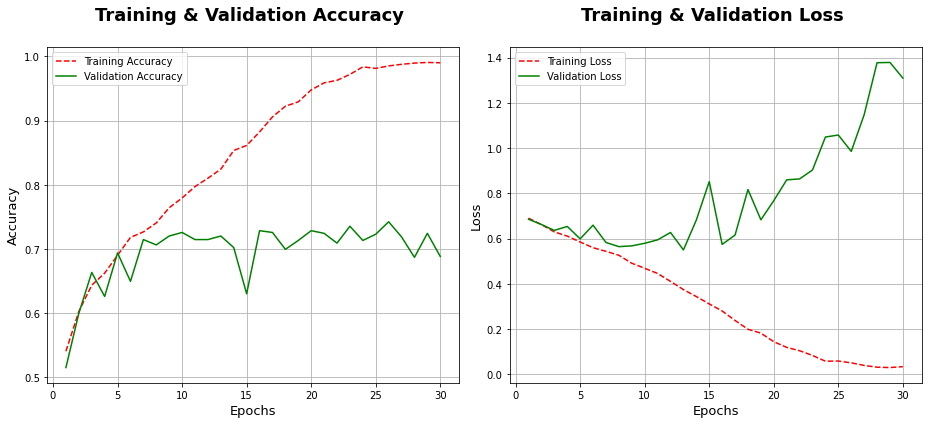

In [149]:
model_plots(history_2.history)

For neatness and efficiency, a function will be created in the next cell that can be used to create convolutional models based on several input parameters.

In [20]:
def conv_model(input_shape, conv, L1_units, L2_units, L3_units, L4_units, L5_units, max_pooling, regularize, optimiser):
    """
    This function will build and compile a convolutional neural network model based on the input parameters.

    Inputs:
    (1) input_shape: specifies the input shape of the images for the neural network.
    (2) conv: specifies the size of the convolution window pixels.
    (3) L1_units: An integer input that dictates the number of units in layer 1 of the CNN.
    (4) L2_units: An integer input that dictates the number of units in layer 2 of the CNN.
    (5) L3_units: An integer input that dictates the number of units in layer 3 of the CNN.
    (6) L4_units: An integer input that dictates the number of units in layer 4 of the CNN.
    (7) L5_units: 
    (8) max_pooling: A Boolean input that dictates if (2,2) max pooling is added to the end of layers 1,2,3 & 4 
        of the of the CNN.
    (9) regularize: A Boolean input that dictates if the model has regualrisation applied. Options for this are: 
        - "L1" for L1 regularisation,
        - "L2"for L2 regularisation,
        - "dropout" for dropout to be added.
    (10) optimizer: A string input that will specifify the optimiser for the created model. For example this input might be "rmsprop" or "adam".

    Returns:
    (1) Compiled convolutional neural network (NN) model.

    Prints:
    (1) A summary of the created convolutional NN model.

    """
    # Create the conv sequential model:
    conv_model = models.Sequential()

    # Layer 1: (input layer)
    conv_model.add(layers.Conv2D(L1_units, (conv,conv), activation='relu', input_shape=input_shape))
    if max_pooling==True:
        conv_model.add(layers.MaxPooling2D((2,2)))
        print("L1 Pooling")

    # Layer 2: (allowed: max_pooling & dropout only):
    if regularize==False: 
        conv_model.add(layers.Conv2D(L2_units, (conv,conv), activation='relu'))
    elif regularize=="dropout":
        conv_model.add(layers.Conv2D(L2_units, (conv,conv), activation='relu'))
        conv_model.add(tf.keras.layers.Dropout(0.2))
    else:
        conv_model.add(layers.Conv2D(L2_units, (conv,conv), activation='relu'))
    if max_pooling==True:
        conv_model.add(layers.MaxPooling2D((2,2)))

    # Layer 3: (allowed: max_pooling, dropout & L1/L2 regularisation)
    if regularize == 'L1':
        conv_model.add(layers.Conv2D(L3_units, (conv,conv), activation='relu', kernel_regularizer = tf.keras.regularizers.l1(l=0.01)))
    elif regularize == 'L2':
        conv_model.add(layers.Conv2D(L3_units, (conv,conv), activation='relu', kernel_regularizer = tf.keras.regularizers.l2(l=0.01)))
    elif regularize == "dropout":
        conv_model.add(layers.Conv2D(L3_units, (conv,conv), activation='relu'))
        conv_model.add(tf.keras.layers.Dropout(0.2))
    else:
        conv_model.add(layers.Conv2D(L3_units, (conv,conv), activation='relu'))

    if max_pooling == True:
        conv_model.add(layers.MaxPooling2D((2,2)))
    else:
        next
    
        # Layer 4: (allowed: max_pooling, dropout & L1/L2 regularisation)
    if regularize == 'L1':
        conv_model.add(layers.Conv2D(L4_units, (conv,conv), activation='relu', kernel_regularizer = tf.keras.regularizers.l1(l=0.01)))
    elif regularize == 'L2':
        conv_model.add(layers.Conv2D(L4_units, (conv,conv), activation='relu', kernel_regularizer = tf.keras.regularizers.l2(l=0.01)))
    elif regularize == "dropout":
        conv_model.add(layers.Conv2D(L4_units, (conv,conv), activation='relu'))
        conv_model.add(tf.keras.layers.Dropout(0.2))
    else:
        conv_model.add(layers.Conv2D(L4_units, (conv,conv), activation='relu'))

    if max_pooling == True:
        conv_model.add(layers.MaxPooling2D((2,2)))
    else:
        next
    
    # Flatten the output so it can be passed into a Dense layer:
    conv_model.add(layers.Flatten())

    # Layer 5: (Dense Layer) (allowed: dropout & L1/L2 regularisation only)
    if regularize == 'L1':
        conv_model.add(layers.Dense(L5_units, activation='relu', kernel_regularizer = tf.keras.regularizers.l1(l=0.01)))
    elif regularize == 'L2':
        conv_model.add(layers.Dense(L5_units, activation='relu', kernel_regularizer = tf.keras.regularizers.l2(l=0.01)))
    elif regularize == 'dropout':
        conv_model.add(layers.Dense(L5_units, activation='relu'))
        conv_model.add(tf.keras.layers.Dropout(0.2))
    else:
        conv_model.add(layers.Dense(L5_units, activation='relu'))

    # Layer 6: (Output Dense Layer)
    conv_model.add(layers.Dense(2, activation='softmax'))

    conv_model.compile(optimizer = optimiser,
                  loss = 'categorical_crossentropy',
                  metrics = ['acc'])

    conv_model.summary()
    return conv_model

In [39]:
# Retrain the last model to just before it starts overfitting at around 13 epochs:
optimiser = optimizers.RMSprop(learning_rate=1e-04)
model_2B = conv_model(input_shape=(128,128,3), conv=6, L1_units=50, L2_units=64, L3_units=128, 
                        L4_units=128, L5_units=700, max_pooling=True, regularize=False, optimiser=optimiser)

history_2B = model_2B.fit(x_train_128_SR, y_train, batch_size=50,
         validation_data = (x_val_128_SR, y_val), epochs=13, shuffle=True)

# Save the model:
model_2B.save('128_SR_13e_model_2B.h5')

L1 Pooling
Model: "sequential_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_24 (Conv2D)          (None, 123, 123, 50)      5450      
                                                                 
 max_pooling2d_24 (MaxPoolin  (None, 61, 61, 50)       0         
 g2D)                                                            
                                                                 
 conv2d_25 (Conv2D)          (None, 56, 56, 64)        115264    
                                                                 
 max_pooling2d_25 (MaxPoolin  (None, 28, 28, 64)       0         
 g2D)                                                            
                                                                 
 conv2d_26 (Conv2D)          (None, 23, 23, 128)       295040    
                                                                 
 max_pooling2d_26 (MaxPoolin  (None, 11, 11

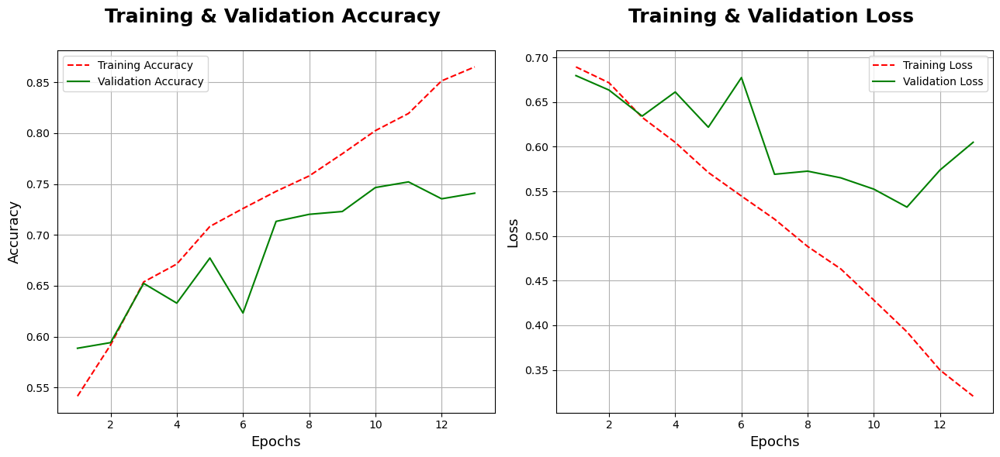

27/27 [==============================] - 0s 10ms/step - loss: 0.5547 - acc: 0.7500


[0.5547124743461609, 0.75]

In [40]:
model_plots(history_2B.history)

# evaluate this  model on the 128x128 SR test set:
model_2B.evaluate(x_test_128_SR, y_test)

# 5.1 Applying Regularisation to the Previous Model
Next, the previous model will be retrained but with L2 regularisation applied, to investigate if this leads to a better performing model.

In [152]:
# Try again with regularisation applied:
optimiser = optimizers.RMSprop(learning_rate=1e-04)
model_2C = conv_model(input_shape=(128,128,3), conv=6, L1_units=50, L2_units=64, L3_units=128, 
                        L4_units=128, L5_units=700, max_pooling=True, regularize='L2', optimiser=optimiser)

history_2C = model_2C.fit(x_train_128_SR, y_train, batch_size=50,
         validation_data = (x_val_128_SR, y_val), epochs=40, shuffle=True)

# Save the model:
model_2C.save('128_SR_40e_model_2C_L2.h5')

L1 Pooling
Model: "sequential_8"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_26 (Conv2D)           (None, 123, 123, 50)      5450      
_________________________________________________________________
max_pooling2d_26 (MaxPooling (None, 61, 61, 50)        0         
_________________________________________________________________
conv2d_27 (Conv2D)           (None, 56, 56, 64)        115264    
_________________________________________________________________
max_pooling2d_27 (MaxPooling (None, 28, 28, 64)        0         
_________________________________________________________________
conv2d_28 (Conv2D)           (None, 23, 23, 128)       295040    
_________________________________________________________________
max_pooling2d_28 (MaxPooling (None, 11, 11, 128)       0         
_________________________________________________________________
conv2d_29 (Conv2D)           (None, 6, 6, 1

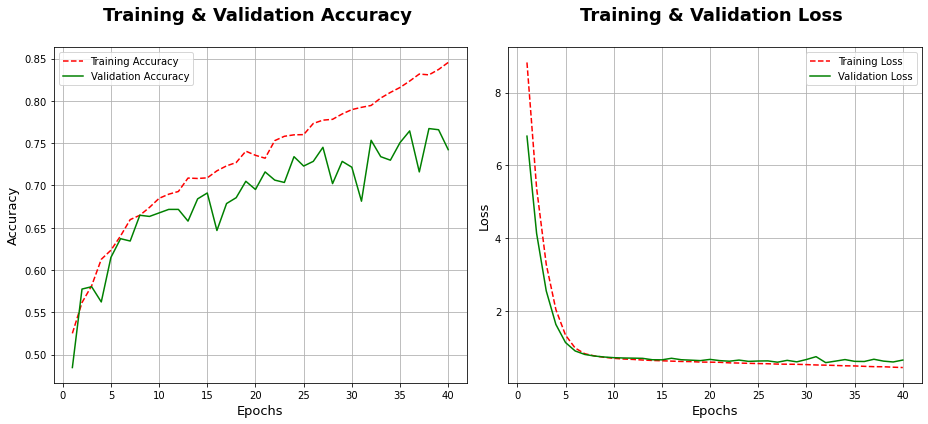

In [154]:
model_plots(history_2C.history)

In [41]:
# Retrain this model to the point just before it starts overfitting at 32 epochs:
model_2D = conv_model(input_shape=(128,128,3), conv=6, L1_units=50, L2_units=64, L3_units=128, 
                        L4_units=128, L5_units=700, max_pooling=True, regularize='L2', optimiser=optimiser)

history_2D = model_2D.fit(x_train_128_SR, y_train, batch_size=50,
         validation_data = (x_val_128_SR, y_val), epochs=32, shuffle=True)

# Save the model:
model_2D.save('128_SR_32e_model_2D_L2.h5')

L1 Pooling
Model: "sequential_7"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_28 (Conv2D)          (None, 123, 123, 50)      5450      
                                                                 
 max_pooling2d_28 (MaxPoolin  (None, 61, 61, 50)       0         
 g2D)                                                            
                                                                 
 conv2d_29 (Conv2D)          (None, 56, 56, 64)        115264    
                                                                 
 max_pooling2d_29 (MaxPoolin  (None, 28, 28, 64)       0         
 g2D)                                                            
                                                                 
 conv2d_30 (Conv2D)          (None, 23, 23, 128)       295040    
                                                                 
 max_pooling2d_30 (MaxPoolin  (None, 11, 11

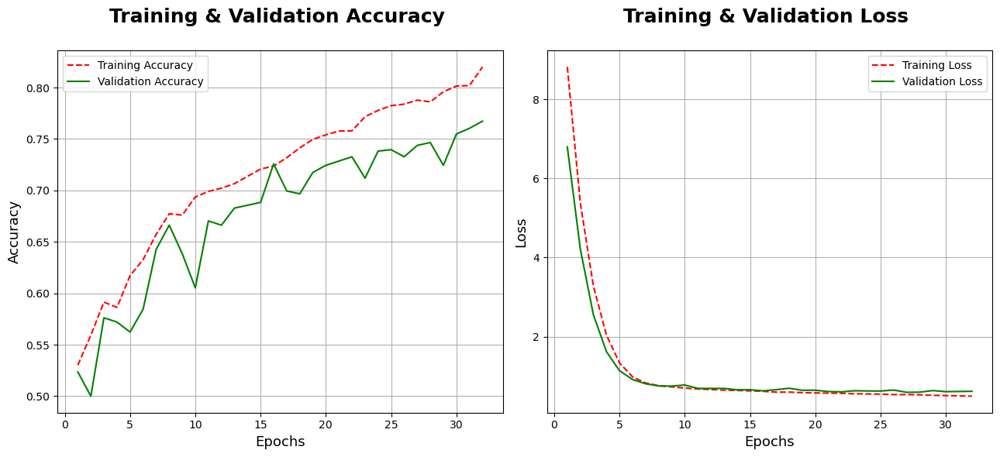

27/27 [==============================] - 6s 220ms/step - loss: 0.5942 - acc: 0.7664


[0.5941638350486755, 0.7663551568984985]

In [42]:
model_plots(history_2D.history)

# Evaluate this model on the 128x128 SR test set:
model_2D.evaluate(x_test_128_SR, y_test) 

# 5.2 Test a Larger Convolution Window Model on the SR Data
A larger convolution window of (8,8) will be tested to investigate if this leads to an increase in model performance.

In [23]:
# Neural Network Classifier for the 128x128 Sharpened cats vs dogs test dataset, larger conv:
optimiser = optimizers.RMSprop(learning_rate=1e-04)
# Testing (8,8) conv:
model_3 = conv_model(input_shape=(128,128,3), conv=8, L1_units=50, L2_units=64, L3_units=128, 
                        L4_units=128, L5_units=700, max_pooling=True, regularize=False, optimiser=optimiser)

history_3 = model_3.fit(x_train_128_SR, y_train, batch_size=50,
         validation_data = (x_val_128_SR, y_val), epochs=30, shuffle=True)

# Save the model:
model_3.save('128_SR_30e_model_3.h5')

2023-02-11 18:28:46.295373: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2023-02-11 18:28:46.296384: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2023-02-11 18:28:46.453395: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2023-02-11 18:28:46.454574: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2023-02-11 18:28:46.455635: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from S

L1 Pooling
Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 121, 121, 50)      9650      
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 60, 60, 50)        0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 53, 53, 64)        204864    
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 26, 26, 64)        0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 19, 19, 128)       524416    
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (None, 9, 9, 128)         0         
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 2, 2, 128

2023-02-11 18:28:50.434491: W tensorflow/core/framework/cpu_allocator_impl.cc:80] Allocation of 804126720 exceeds 10% of free system memory.
2023-02-11 18:28:51.431645: W tensorflow/core/framework/cpu_allocator_impl.cc:80] Allocation of 804126720 exceeds 10% of free system memory.
2023-02-11 18:28:52.129514: I tensorflow/compiler/mlir/mlir_graph_optimization_pass.cc:185] None of the MLIR Optimization Passes are enabled (registered 2)


Epoch 1/30


2023-02-11 18:28:54.194046: I tensorflow/stream_executor/cuda/cuda_dnn.cc:369] Loaded cuDNN version 8005


82/82 [==============================] - ETA: 0s - loss: 0.6903 - acc: 0.5230

2023-02-11 18:29:07.314911: W tensorflow/core/framework/cpu_allocator_impl.cc:80] Allocation of 141950976 exceeds 10% of free system memory.
2023-02-11 18:29:07.539480: W tensorflow/core/framework/cpu_allocator_impl.cc:80] Allocation of 141950976 exceeds 10% of free system memory.


82/82 [==============================] - 16s 70ms/step - loss: 0.6903 - acc: 0.5230 - val_loss: 0.6834 - val_acc: 0.5568
Epoch 2/30
82/82 [==============================] - 4s 49ms/step - loss: 0.6716 - acc: 0.5878 - val_loss: 0.6609 - val_acc: 0.5956
Epoch 3/30
82/82 [==============================] - 4s 49ms/step - loss: 0.6401 - acc: 0.6403 - val_loss: 0.6428 - val_acc: 0.6260
Epoch 4/30
82/82 [==============================] - 4s 50ms/step - loss: 0.6138 - acc: 0.6672 - val_loss: 0.6448 - val_acc: 0.6247
Epoch 5/30
82/82 [==============================] - 4s 49ms/step - loss: 0.5936 - acc: 0.6878 - val_loss: 0.6370 - val_acc: 0.6565
Epoch 6/30
82/82 [==============================] - 4s 50ms/step - loss: 0.5724 - acc: 0.7068 - val_loss: 0.5951 - val_acc: 0.7050
Epoch 7/30
82/82 [==============================] - 4s 53ms/step - loss: 0.5496 - acc: 0.7218 - val_loss: 0.5749 - val_acc: 0.7244
Epoch 8/30
82/82 [==============================] - 4s 49ms/step - loss: 0.5266 - acc: 0.7433

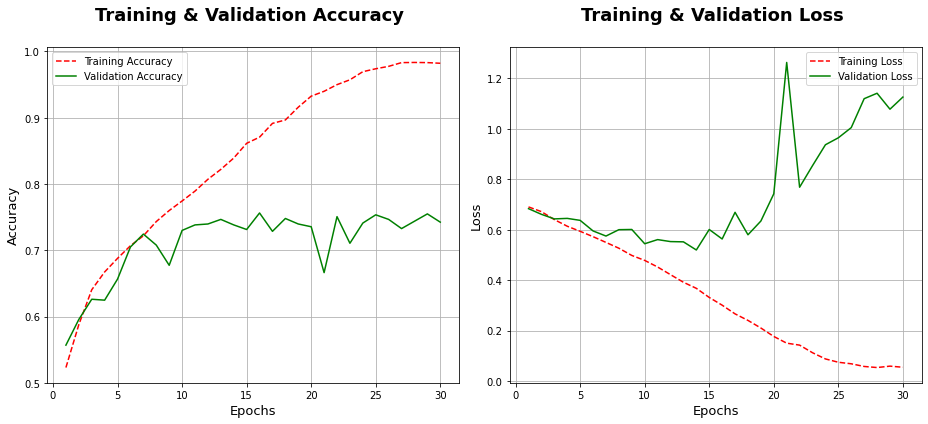

In [26]:
model_plots(history_3.history)

In [40]:
# Retrain the previous model to just before overfitting starts at around 14 epochs:
optimiser = optimizers.RMSprop(learning_rate=1e-04)
model_3B = conv_model(input_shape=(128,128,3), conv=8, L1_units=50, L2_units=64, L3_units=128, 
                        L4_units=128, L5_units=700, max_pooling=True, regularize=False, optimiser=optimiser)

history_3B = model_3B.fit(x_train_128_SR, y_train, batch_size=50,
         validation_data = (x_val_128_SR, y_val), epochs=14, shuffle=True)

# Save the model:
model_3B.save('128_SR_14e_model_3B.h5')

L1 Pooling
Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_16 (Conv2D)          (None, 121, 121, 50)      9650      
                                                                 
 max_pooling2d_16 (MaxPoolin  (None, 60, 60, 50)       0         
 g2D)                                                            
                                                                 
 conv2d_17 (Conv2D)          (None, 53, 53, 64)        204864    
                                                                 
 max_pooling2d_17 (MaxPoolin  (None, 26, 26, 64)       0         
 g2D)                                                            
                                                                 
 conv2d_18 (Conv2D)          (None, 19, 19, 128)       524416    
                                                                 
 max_pooling2d_18 (MaxPoolin  (None, 9, 9, 

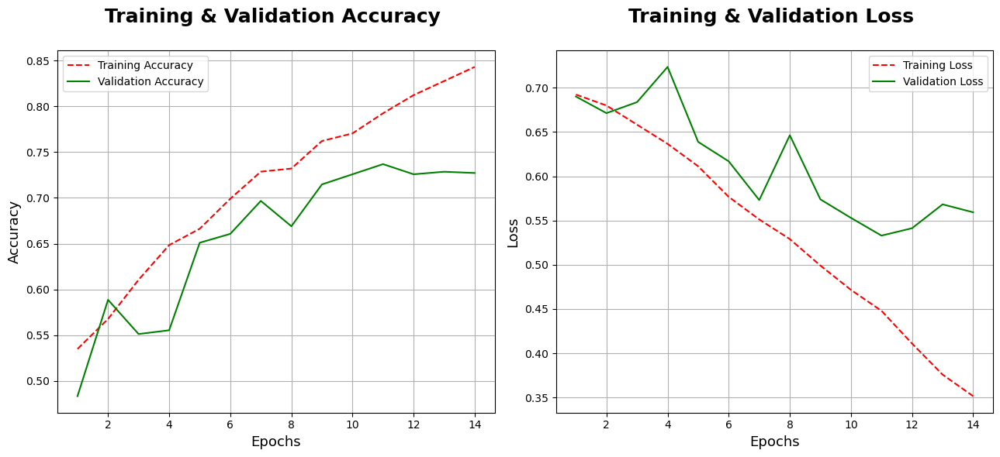

In [41]:
model_plots(history_3B.history)

In [42]:
# Evaluate the trained model on the test data:
model_3B.evaluate(x_test_128_SR, y_test)

27/27 [==============================] - 21s 820ms/step - loss: 0.5458 - acc: 0.7418


[0.5457987785339355, 0.7418224215507507]

# 5.3 Applying Regularisation to the Larger (8,8) Convolutional Model
Next, the larger convolution size model will be trained again but with L2 regularisation applied, to investigate if this leads to improved performance.

In [30]:
# Try L2 regularisation with the larger (8,8) convolutional model:
optimiser = optimizers.RMSprop(learning_rate=1e-04)
model_3C = conv_model(input_shape=(128,128,3), conv=8, L1_units=50, L2_units=64, L3_units=128, 
                        L4_units=128, L5_units=700, max_pooling=True, regularize='L2', optimiser=optimiser)

history_3C = model_3C.fit(x_train_128_SR, y_train, batch_size=30,
         validation_data = (x_val_128_SR, y_val), epochs=50, shuffle=True)

# Save the model:
model_3C.save('128_SR_50e_model_3C_L2.h5')

L1 Pooling
Model: "sequential_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_12 (Conv2D)           (None, 121, 121, 50)      9650      
_________________________________________________________________
max_pooling2d_12 (MaxPooling (None, 60, 60, 50)        0         
_________________________________________________________________
conv2d_13 (Conv2D)           (None, 53, 53, 64)        204864    
_________________________________________________________________
max_pooling2d_13 (MaxPooling (None, 26, 26, 64)        0         
_________________________________________________________________
conv2d_14 (Conv2D)           (None, 19, 19, 128)       524416    
_________________________________________________________________
max_pooling2d_14 (MaxPooling (None, 9, 9, 128)         0         
_________________________________________________________________
conv2d_15 (Conv2D)           (None, 2, 2, 1

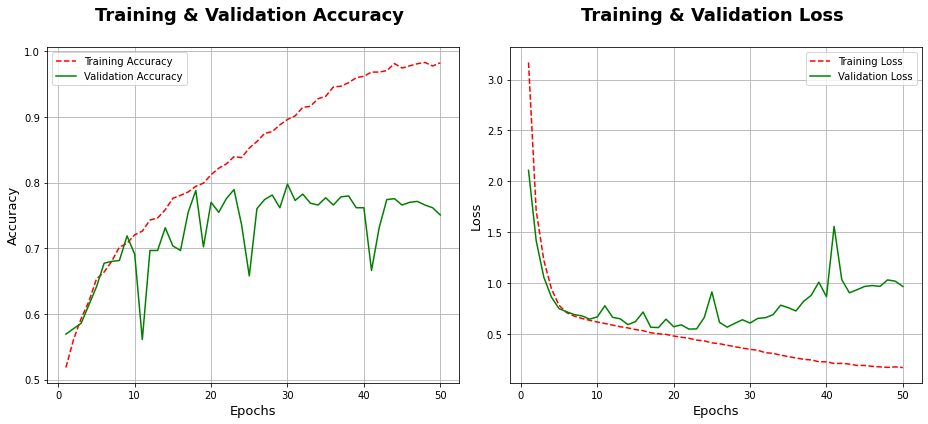

In [31]:
model_plots(history_3C.history)

In [34]:
# Retrain the previous model to the point where it starts overfitting around 22 epochs:
optimiser = optimizers.RMSprop(learning_rate=1e-04)
model_3D = conv_model(input_shape=(128,128,3), conv=8, L1_units=50, L2_units=64, L3_units=128, 
                        L4_units=128, L5_units=700, max_pooling=True, regularize='L2', optimiser=optimiser)

history_3D = model_3D.fit(x_train_128_SR, y_train, batch_size=50,
         validation_data = (x_val_128_SR, y_val), epochs=22, shuffle=True)

# Save the model:
model_3D.save('128_SR_22e_model_3D_L2.h5')

L1 Pooling
Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_12 (Conv2D)          (None, 121, 121, 50)      9650      
                                                                 
 max_pooling2d_12 (MaxPoolin  (None, 60, 60, 50)       0         
 g2D)                                                            
                                                                 
 conv2d_13 (Conv2D)          (None, 53, 53, 64)        204864    
                                                                 
 max_pooling2d_13 (MaxPoolin  (None, 26, 26, 64)       0         
 g2D)                                                            
                                                                 
 conv2d_14 (Conv2D)          (None, 19, 19, 128)       524416    
                                                                 
 max_pooling2d_14 (MaxPoolin  (None, 9, 9, 

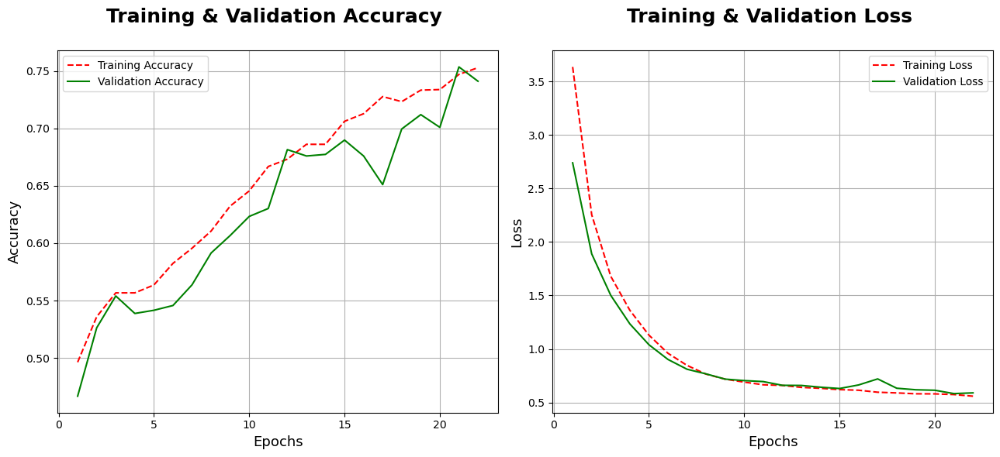

27/27 [==============================] - 0s 11ms/step - loss: 0.5832 - acc: 0.7360


[0.5831725597381592, 0.735981285572052]

In [35]:
# Plot the training and validation loss and accuracy over each epoch:
model_plots(history_3D.history)
# Calculate the accuracy on the test set:
model_3D.evaluate(x_test_128_SR, y_test)

# 6. Training Models on the 128x128 High Resolution (HR) Image Data
Now the high resolution (HR) data will be used to train another set of neural network classifier models. These models have will have the same form as the previous SR models and will have the better performing (6,6) convolution size. The accuracy metrics from these models should help to contextualise the previous results generated in this notebook.

In [21]:
# Classifier for original HR 128x128 cats vs dogs dataset for comparison to previous results:
optimiser = optimizers.RMSprop(learning_rate=1e-04)
model_4 = conv_model(input_shape=(128,128,3), conv=6, L1_units=50, L2_units=64, L3_units=128, 
                        L4_units=128, L5_units=700, max_pooling=True, regularize=False, optimiser=optimiser)

history_4 = model_4.fit(x_train_128_HR, y_train, batch_size=50,
         validation_data = (x_val_128_HR, y_val), epochs=30)

# Save the model:
model_4.save('128_HR_30e_model_4.h5')

L1 Pooling
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 123, 123, 50)      5450      
                                                                 
 max_pooling2d (MaxPooling2D  (None, 61, 61, 50)       0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 56, 56, 64)        115264    
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 28, 28, 64)       0         
 2D)                                                             
                                                                 
 conv2d_2 (Conv2D)           (None, 23, 23, 128)       295040    
                                                                 
 max_pooling2d_2 (MaxPooling  (None, 11, 11, 

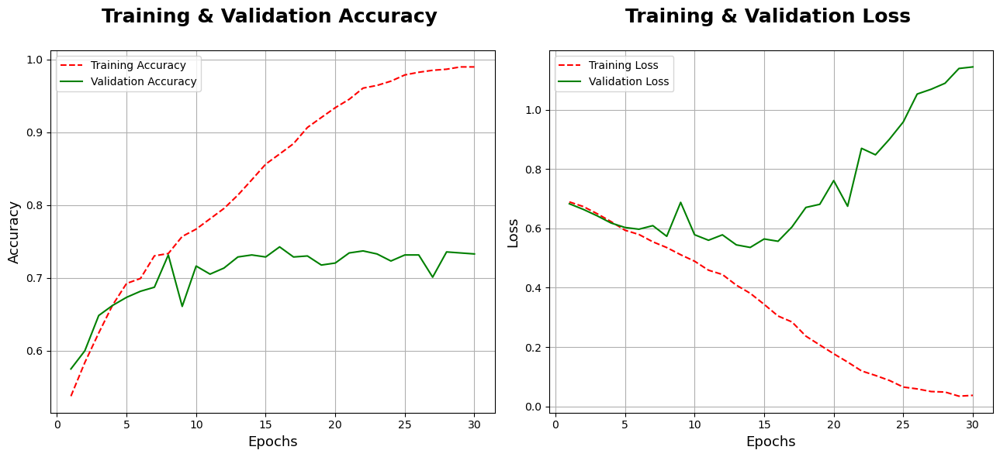

In [22]:
model_plots(history_4.history)

In [27]:
# Retrain the previous model to just before overfitting at 14 epochs:
optimiser = optimizers.RMSprop(learning_rate=1e-04)
model_4B = conv_model(input_shape=(128,128,3), conv=6, L1_units=50, L2_units=64, L3_units=128, 
                        L4_units=128, L5_units=700, max_pooling=True, regularize=False, optimiser=optimiser)

history_4B = model_4B.fit(x_train_128_HR, y_train, batch_size=50,
         validation_data = (x_val_128_HR, y_val), epochs=14)

# Save the model:
model_4B.save('128_HR_14e_model_4B.h5')

L1 Pooling
Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_4 (Conv2D)            (None, 123, 123, 50)      5450      
_________________________________________________________________
max_pooling2d_4 (MaxPooling2 (None, 61, 61, 50)        0         
_________________________________________________________________
conv2d_5 (Conv2D)            (None, 56, 56, 64)        115264    
_________________________________________________________________
max_pooling2d_5 (MaxPooling2 (None, 28, 28, 64)        0         
_________________________________________________________________
conv2d_6 (Conv2D)            (None, 23, 23, 128)       295040    
_________________________________________________________________
max_pooling2d_6 (MaxPooling2 (None, 11, 11, 128)       0         
_________________________________________________________________
conv2d_7 (Conv2D)            (None, 6, 6, 1

2023-02-11 20:41:39.439993: W tensorflow/core/framework/cpu_allocator_impl.cc:80] Allocation of 804126720 exceeds 10% of free system memory.
2023-02-11 20:41:40.417132: W tensorflow/core/framework/cpu_allocator_impl.cc:80] Allocation of 804126720 exceeds 10% of free system memory.


Epoch 1/14
82/82 [==============================] - 5s 57ms/step - loss: 0.6888 - acc: 0.5296 - val_loss: 0.7005 - val_acc: 0.5097
Epoch 2/14
82/82 [==============================] - 4s 50ms/step - loss: 0.6614 - acc: 0.6078 - val_loss: 0.6474 - val_acc: 0.6053
Epoch 3/14
82/82 [==============================] - 4s 51ms/step - loss: 0.6211 - acc: 0.6579 - val_loss: 0.6291 - val_acc: 0.6496
Epoch 4/14
82/82 [==============================] - 4s 50ms/step - loss: 0.5904 - acc: 0.6924 - val_loss: 0.6766 - val_acc: 0.6302
Epoch 5/14
82/82 [==============================] - 4s 51ms/step - loss: 0.5659 - acc: 0.7176 - val_loss: 0.6848 - val_acc: 0.6427
Epoch 6/14
82/82 [==============================] - 4s 53ms/step - loss: 0.5354 - acc: 0.7377 - val_loss: 0.5738 - val_acc: 0.7008
Epoch 7/14
82/82 [==============================] - 4s 51ms/step - loss: 0.4991 - acc: 0.7641 - val_loss: 0.5564 - val_acc: 0.7105
Epoch 8/14
82/82 [==============================] - 4s 51ms/step - loss: 0.4694 - a

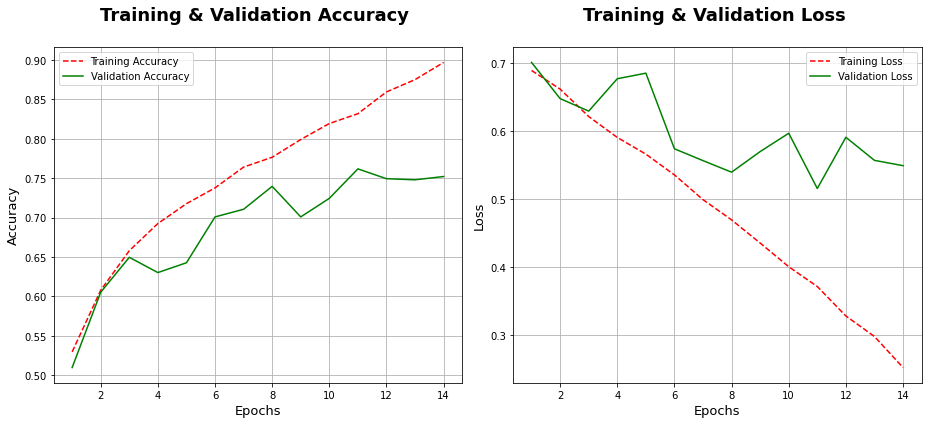

27/27 [==============================] - 1s 23ms/step - loss: 0.5315 - acc: 0.7780


[0.5315483808517456, 0.7780373692512512]

In [28]:
model_plots(history_4B.history)

# Evaluate this model on the HR test data:
model_4B.evaluate(x_test_128_HR, y_test)

# 6.1 Adding Regularisation to the Model
Next, the previous HR model will be retrained with L2 regularisation applied, to investigate if this leads to improved model performance.

In [26]:
# Try adding regularisation to improve the HR model performance:
optimiser = optimizers.RMSprop(learning_rate=1e-04)
model_4C = conv_model(input_shape=(128,128,3), conv=6, L1_units=50, L2_units=64, L3_units=128, 
                        L4_units=128, L5_units=700, max_pooling=True, regularize='L2', optimiser=optimiser)

history_4C = model_4C.fit(x_train_128_HR, y_train, batch_size=50,
         validation_data = (x_val_128_HR, y_val), epochs=60)

# Save the model:
model_4C.save('128_HR_60e_model_4C.h5')

L1 Pooling
Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_8 (Conv2D)            (None, 123, 123, 50)      5450      
_________________________________________________________________
max_pooling2d_8 (MaxPooling2 (None, 61, 61, 50)        0         
_________________________________________________________________
conv2d_9 (Conv2D)            (None, 56, 56, 64)        115264    
_________________________________________________________________
max_pooling2d_9 (MaxPooling2 (None, 28, 28, 64)        0         
_________________________________________________________________
conv2d_10 (Conv2D)           (None, 23, 23, 128)       295040    
_________________________________________________________________
max_pooling2d_10 (MaxPooling (None, 11, 11, 128)       0         
_________________________________________________________________
conv2d_11 (Conv2D)           (None, 6, 6, 1

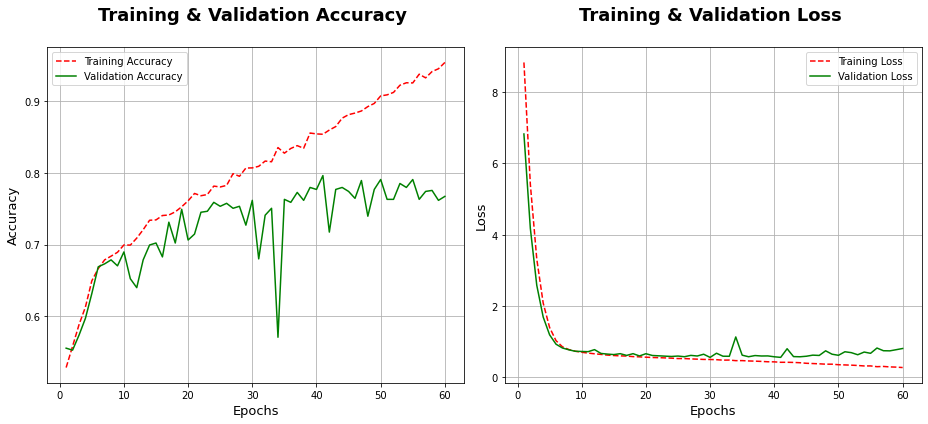

In [27]:
model_plots(history_4C.history)

In [29]:
# Retrain the previous model to just before overfitting starts at 30 epochs:
optimiser = optimizers.RMSprop(learning_rate=1e-04)
model_4D = conv_model(input_shape=(128,128,3), conv=6, L1_units=50, L2_units=64, L3_units=128, 
                        L4_units=128, L5_units=700, max_pooling=True, regularize='L2', optimiser=optimiser)

history_4D = model_4D.fit(x_train_128_HR, y_train, batch_size=50,
         validation_data = (x_val_128_HR, y_val), epochs=30)

# Save the model:
model_4D.save('128_HR_30e_model_4D.h5')

L1 Pooling
Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_8 (Conv2D)            (None, 123, 123, 50)      5450      
_________________________________________________________________
max_pooling2d_8 (MaxPooling2 (None, 61, 61, 50)        0         
_________________________________________________________________
conv2d_9 (Conv2D)            (None, 56, 56, 64)        115264    
_________________________________________________________________
max_pooling2d_9 (MaxPooling2 (None, 28, 28, 64)        0         
_________________________________________________________________
conv2d_10 (Conv2D)           (None, 23, 23, 128)       295040    
_________________________________________________________________
max_pooling2d_10 (MaxPooling (None, 11, 11, 128)       0         
_________________________________________________________________
conv2d_11 (Conv2D)           (None, 6, 6, 1

2023-02-11 19:20:31.794511: W tensorflow/core/framework/cpu_allocator_impl.cc:80] Allocation of 804126720 exceeds 10% of free system memory.


Epoch 1/30
82/82 [==============================] - 6s 59ms/step - loss: 8.7947 - acc: 0.5210 - val_loss: 6.7488 - val_acc: 0.4958
Epoch 2/30
82/82 [==============================] - 4s 51ms/step - loss: 5.3162 - acc: 0.5638 - val_loss: 4.1538 - val_acc: 0.4972
Epoch 3/30
82/82 [==============================] - 4s 52ms/step - loss: 3.2506 - acc: 0.5934 - val_loss: 2.5276 - val_acc: 0.5651
Epoch 4/30
82/82 [==============================] - 4s 53ms/step - loss: 2.0173 - acc: 0.6042 - val_loss: 1.6151 - val_acc: 0.5845
Epoch 5/30
82/82 [==============================] - 4s 52ms/step - loss: 1.3247 - acc: 0.6401 - val_loss: 1.1413 - val_acc: 0.6163
Epoch 6/30
82/82 [==============================] - 4s 54ms/step - loss: 0.9702 - acc: 0.6628 - val_loss: 0.8763 - val_acc: 0.6676
Epoch 7/30
82/82 [==============================] - 4s 52ms/step - loss: 0.8156 - acc: 0.6653 - val_loss: 0.7869 - val_acc: 0.6454
Epoch 8/30
82/82 [==============================] - 4s 53ms/step - loss: 0.7503 - a

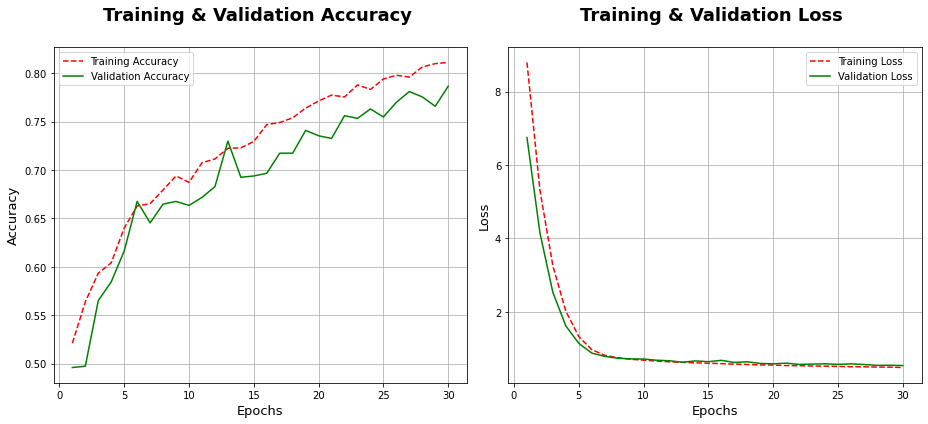

27/27 [==============================] - 0s 14ms/step - loss: 0.5315 - acc: 0.7991


[0.5314982533454895, 0.7990654110908508]

In [30]:
model_plots(history_4D.history)

# Evaluate this model on the HR test data:
model_4D.evaluate(x_test_128_HR, y_test)

# 7. Downloading of Output H5 Trained Model Files

The code in the below cells can be used to generate a download link for downloading all of the saved .h5 trained model files in this notebook.

In [37]:
import os
from IPython.display import FileLink
os.chdir(r'/kaggle/working')

In [41]:
FileLink(r'128_SR_14e_model_3B.h5')

/kaggle/working/128_SR_14e_model_3B.h5